# ☘️ PLANT DISEASE CLASSIFICATION

# Objectif  

L’objectif est clair et simple. Nous devons construire un modèle capable de distinguer entre des feuilles de culture saines et malades et, si la plante présente une maladie, prédire laquelle.


## Importer les librairies

In [1]:
!pip install torchsummary

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: C:\Program Files\Python313\python.exe -m pip install --upgrade pip


In [2]:
!pip install gdown

Defaulting to user installation because normal site-packages is not writeable



[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: C:\Program Files\Python313\python.exe -m pip install --upgrade pip


In [3]:
from pathlib import Path
import gdown, shutil

url="https://drive.google.com/file/d/1-_dZIapiHfzz0AUiBJ_OSxpZ_4Wa_nO9/view?usp=drive_link"
archive_path=Path("/tmp/images_V2.zip")
gdown.download(url, str(archive_path), quiet=True, fuzzy=True)

data_dir=Path("/tmp/extracted")
data_dir.mkdir(exist_ok=True)
shutil.unpack_archive(str(archive_path), extract_dir=str(data_dir))
print("Extracted to:", data_dir.resolve())


ModuleNotFoundError: No module named 'gdown'

In [ ]:
from pathlib import Path

data_dir = Path("/tmp/extracted")

# List the first few subfolders
for p in list(data_dir.iterdir())[:5]:
    print(p)


/tmp/extracted/new plant diseases dataset(augmented)
/tmp/extracted/test
/tmp/extracted/New Plant Diseases Dataset(Augmented)


In [ ]:
data_dir

PosixPath('/tmp/extracted')

We would require torchsummary library to print the model's summary in keras style (nicely formatted and pretty to look) as Pytorch natively doesn't support that

In [ ]:
import os
import numpy as np
import pandas as pd
import torch
import matplotlib.pyplot as plt
import torch.nn as nn
from torch.utils.data import DataLoader
from PIL import Image
import torch.nn.functional as F
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from torchvision.datasets import ImageFolder
from torchsummary import summary

%matplotlib inline

# Analyse Exploratoire

In [ ]:
data_dir = "/tmp/extracted/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)"

train_dir = data_dir + "/train"
valid_dir = data_dir + "/valid"
diseases = os.listdir(train_dir)

In [ ]:
# printing the disease names
print(diseases)

['Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Early_blight', 'Tomato___Tomato_mosaic_virus', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Orange___Haunglongbing_(Citrus_greening)', 'Grape___Black_rot', 'Potato___Late_blight', 'Tomato___Leaf_Mold', 'Corn_(maize)___healthy', 'Apple___Cedar_apple_rust', 'Tomato___Target_Spot', 'Tomato___Bacterial_spot', 'Peach___Bacterial_spot', 'Pepper,_bell___healthy', 'Tomato___healthy', 'Pepper,_bell___Bacterial_spot', 'Soybean___healthy', 'Cherry_(including_sour)___healthy', 'Tomato___Septoria_leaf_spot', 'Potato___healthy', 'Apple___healthy', 'Strawberry___healthy', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus', 'Tomato___Late_blight', 'Peach___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Grape___Esca_(Black_Measles)', 'Squash___Powdery_mildew', 'Apple___Black_rot', 'Apple___Apple_scab', 'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Strawberry___Leaf_scorch', 'Grape___healthy', 'Blueberry_

In [ ]:
print("Total disease classes are: {}".format(len(diseases)))

Total disease classes are: 38


In [ ]:
plants = []
NumberOfDiseases = 0
for plant in diseases:
    if plant.split('___')[0] not in plants:
        plants.append(plant.split('___')[0])
    if plant.split('___')[1] != 'healthy':
        NumberOfDiseases += 1

Nombre de maladies uniques

In [ ]:
# unique plants in the dataset
print(f"Unique Plants are: \n{plants}")

Unique Plants are: 
['Tomato', 'Corn_(maize)', 'Orange', 'Grape', 'Potato', 'Apple', 'Peach', 'Pepper,_bell', 'Soybean', 'Cherry_(including_sour)', 'Strawberry', 'Squash', 'Blueberry', 'Raspberry']


In [ ]:
# number of unique plants
print("Number of plants: {}".format(len(plants)))

Number of plants: 14


In [ ]:
# number of unique diseases
print("Number of diseases: {}".format(NumberOfDiseases))

Number of diseases: 26


Nous disposons d’images de feuilles provenant de 14 plantes et, en excluant les feuilles saines, nous avons 26 types d’images montrant une maladie spécifique sur une plante donnée.


In [ ]:
# Number of images for each disease
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(train_dir + '/' + disease))

# converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column

img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["no. of images"])
img_per_class

,no. of images
Tomato___Spider_mites Two-spotted_spider_mite,1741
Tomato___Early_blight,1920
Tomato___Tomato_mosaic_virus,1790
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot,1642
Corn_(maize)___Common_rust_,1907
Orange___Haunglongbing_(Citrus_greening),2010
Grape___Black_rot,1888
Potato___Late_blight,1939
Tomato___Leaf_Mold,1882
Corn_(maize)___healthy,1859


#### Visualizing the above information on a graph

Text(0.5, 1.0, 'Images par classe ')

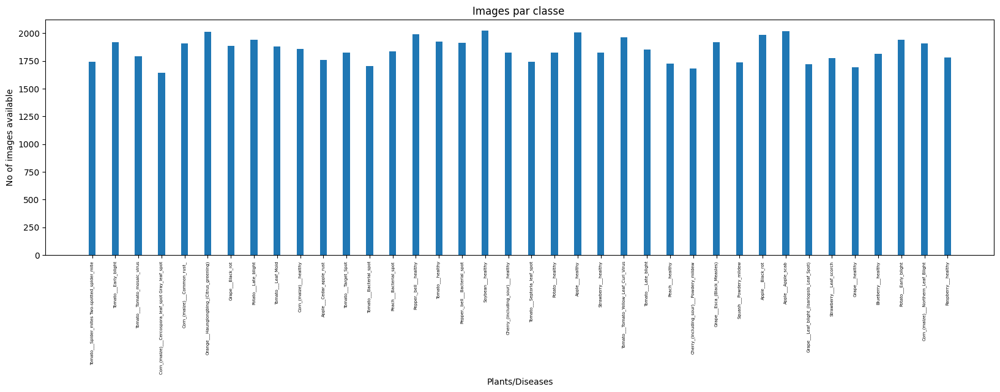

In [ ]:
# plotting number of images available for each disease
index = [n for n in range(38)]
plt.figure(figsize=(20, 5))
plt.bar(index, [n for n in nums.values()], width=0.3)
plt.xlabel('Plants/Diseases', fontsize=10)
plt.ylabel('No of images available', fontsize=10)
plt.xticks(index, diseases, fontsize=5, rotation=90)
plt.title('Images par classe ')

We can see that the dataset is almost balanced for all classes, so we are good to go forward

#### Images pour entrainement

In [ ]:
n_train = 0
for value in nums.values():
    n_train += value
print(f"There are {n_train} images for training")

There are 70295 images for training


#  Preparation des Donnees

In [ ]:
# datasets for validation and training
train = ImageFolder(
    train_dir,
    transform=transforms.ToTensor()
)
valid = ImageFolder(
    valid_dir,
    transform=transforms.ToTensor()
)

In [ ]:
img, label = train[0]
print(img.shape, label)

torch.Size([3, 256, 256]) 0


We can see the shape (3, 256 256) of the image. 3 is the number of channels (RGB) and 256 x 256 is the width and height of the image

In [ ]:
# total number of classes in train set
len(train.classes)

38

In [ ]:
# for checking some images from training dataset
def show_image(image, label):
    print("Label :" + train.classes[label] + "(" + str(label) + ")")
    plt.imshow(image.permute(1, 2, 0))

## 🖼️ Some Images from training dataset 🖼️

In [ ]:
show_image(*train[0])

In [ ]:
show_image(*train[70000])

In [ ]:
show_image(*train[30000])

In [ ]:
# Setting the seed value
random_seed = 7
torch.manual_seed(random_seed)

In [ ]:
# setting the batch size
batch_size = 64

In [ ]:
# DataLoaders for training and validation

train_dl = DataLoader(
    train, batch_size, shuffle=True, num_workers=2, pin_memory=True)

valid_dl = DataLoader(
    valid, batch_size, num_workers=2, pin_memory=True)

In [ ]:
# helper function to show a batch of training instances
def show_batch(data):
    for images, labels in data:
        fig, ax = plt.subplots(figsize=(30, 30))
        ax.set_xticks([]); ax.set_yticks([])
        ax.imshow(make_grid(images, nrow=8).permute(1, 2, 0))
        break

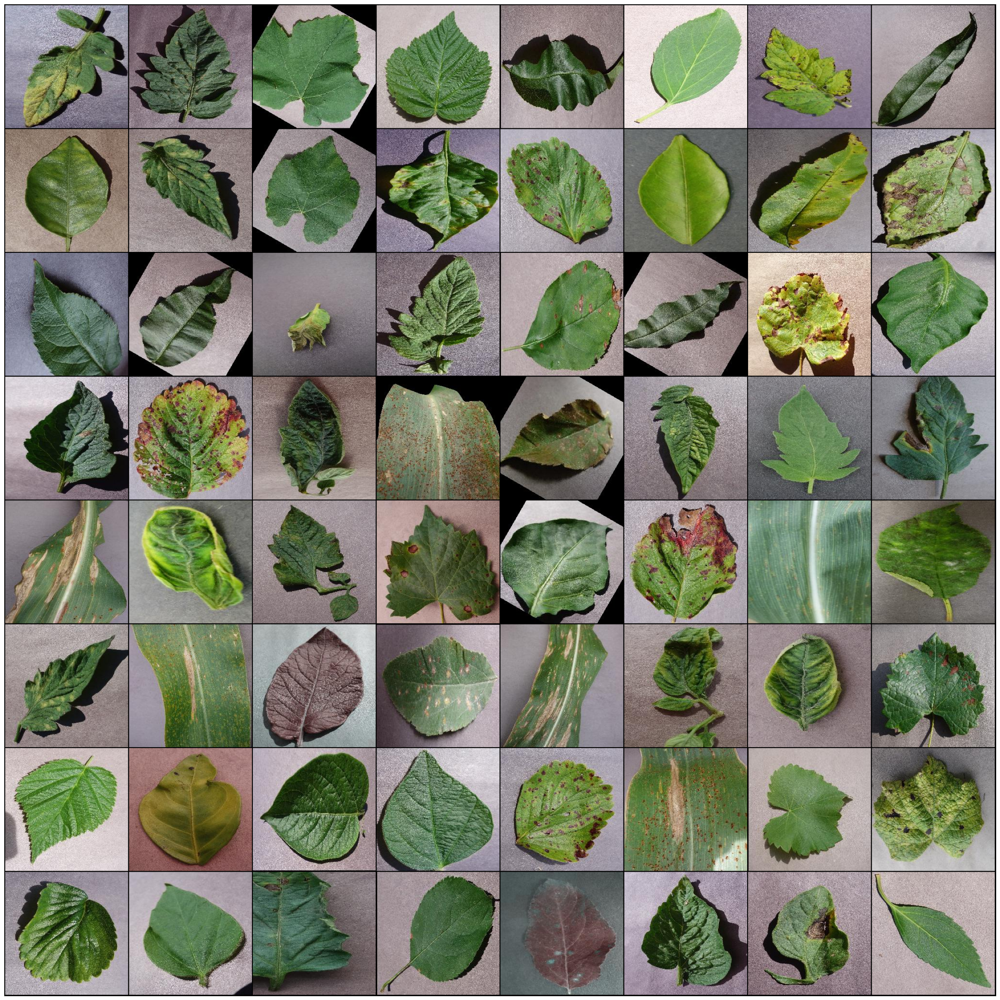

In [ ]:
# Images for first batch of training
show_batch(train_dl)

#  Modelisation

#### Fonctions helpers

In [ ]:
# for moving data into GPU (if available)
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device("cuda")
    else:
        return torch.device("cpu")

# for moving data to device (CPU or GPU)
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

# for loading in the device (GPU if available else CPU)
class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device

    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl:
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

Checking the device we are working with

In [ ]:
device = get_default_device()
device

device(type='cuda')

Wrap up our training and validation data loaders using `DeviceDataLoader` for automatically transferring batches of data to the GPU (if available)

In [ ]:
# Moving data into GPU
train_dl = DeviceDataLoader(
    train_dl,
    device)
valid_dl = DeviceDataLoader(
    valid_dl,
    device)

##  Architecture

#### Residual Block code implementation

In [ ]:
class SimpleResidualBlock(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu1 = nn.ReLU()
        self.conv2 = nn.Conv2d(in_channels=3, out_channels=3, kernel_size=3, stride=1, padding=1)
        self.relu2 = nn.ReLU()

    def forward(self, x):
        out = self.conv1(x)
        out = self.relu1(out)
        out = self.conv2(out)
        return self.relu2(out) + x # ReLU can be applied before or after adding the input

In [ ]:
# for calculating the accuracy

def accuracy(outputs, labels):
    _, preds = torch.max(outputs, dim=1)
    return torch.tensor(torch.sum(preds == labels).item() / len(preds))


# base class for the model
class ImageClassificationBase(nn.Module):

    def training_step(self, batch):
        images, labels = batch
        out = self(images)                  # Generate predictions
        loss = F.cross_entropy(out, labels) # Calculate loss
        return loss

    def validation_step(self, batch):
        images, labels = batch
        out = self(images)                   # Generate prediction
        loss = F.cross_entropy(out, labels)  # Calculate loss
        acc = accuracy(out, labels)          # Calculate accuracy
        return {"val_loss": loss.detach(), "val_accuracy": acc}

    def validation_epoch_end(self, outputs):
        batch_losses = [x["val_loss"] for x in outputs]
        batch_accuracy = [x["val_accuracy"] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()       # Combine loss
        epoch_accuracy = torch.stack(batch_accuracy).mean()
        return {"val_loss": epoch_loss, "val_accuracy": epoch_accuracy} # Combine accuracies

    def epoch_end(self, epoch, result):
        print("Epoch [{}], last_lr: {:.5f}, train_loss: {:.4f}, val_loss: {:.4f}, val_acc: {:.4f}".format(
            epoch, result['lrs'][-1], result['train_loss'], result['val_loss'], result['val_accuracy']))


##  Architecture finale

In [ ]:
# Architecture for training

# convolution block with BatchNormalization
def ConvBlock(in_channels, out_channels, pool=False):
    layers = [nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
             nn.BatchNorm2d(out_channels),
             nn.ReLU(inplace=True)]
    if pool:
        layers.append(nn.MaxPool2d(4))
    return nn.Sequential(*layers)


# resnet architecture
class ResNet9(ImageClassificationBase):
    def __init__(self, in_channels, num_diseases):
        super().__init__()

        self.conv1 = ConvBlock(in_channels, 64)
        self.conv2 = ConvBlock(64, 128, pool=True) # out_dim : 128 x 64 x 64
        self.res1 = nn.Sequential(ConvBlock(128, 128), ConvBlock(128, 128))

        self.conv3 = ConvBlock(128, 256, pool=True) # out_dim : 256 x 16 x 16
        self.conv4 = ConvBlock(256, 512, pool=True) # out_dim : 512 x 4 x 44
        self.res2 = nn.Sequential(ConvBlock(512, 512), ConvBlock(512, 512))

        self.classifier = nn.Sequential(nn.MaxPool2d(4),
                                       nn.Flatten(),
                                       nn.Linear(512, num_diseases))

    def forward(self, xb): # xb is the loaded batch
        out = self.conv1(xb)
        out = self.conv2(out)
        out = self.res1(out) + out
        out = self.conv3(out)
        out = self.conv4(out)
        out = self.res2(out) + out
        out = self.classifier(out)
        return out

Now, we define a model object and transfer it into the device with which we are working...

In [ ]:
# defining the model and moving it to the GPU
model = to_device(ResNet9(3, len(train.classes)), device)
model

ResNet9(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): MaxPool2d(kernel_size=4, stride=4, padding=0, dilation=1, ceil_mode=False)
  )
  (res1): Sequential(
    (0): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=True)
    )
    (1): Sequential(
      (0): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): ReLU(inplace=Tr

In [ ]:
# getting summary of the model
INPUT_SHAPE = (3, 256, 256)
print(summary(model.cuda(), (INPUT_SHAPE)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 256, 256]           1,792
       BatchNorm2d-2         [-1, 64, 256, 256]             128
              ReLU-3         [-1, 64, 256, 256]               0
            Conv2d-4        [-1, 128, 256, 256]          73,856
       BatchNorm2d-5        [-1, 128, 256, 256]             256
              ReLU-6        [-1, 128, 256, 256]               0
         MaxPool2d-7          [-1, 128, 64, 64]               0
            Conv2d-8          [-1, 128, 64, 64]         147,584
       BatchNorm2d-9          [-1, 128, 64, 64]             256
             ReLU-10          [-1, 128, 64, 64]               0
           Conv2d-11          [-1, 128, 64, 64]         147,584
      BatchNorm2d-12          [-1, 128, 64, 64]             256
             ReLU-13          [-1, 128, 64, 64]               0
           Conv2d-14          [-1, 256,

# Entrainement

Before we train the model, Let’s define a utility functionan `evaluate` function, which will perform the validation phase, and a `fit_one_cycle` function which will perform the entire training process. In `fit_one_cycle`, we have use some techniques:

- **Learning Rate Scheduling** : Au lieu d’utiliser un taux d’apprentissage fixe, nous allons employer un planificateur de taux d’apprentissage qui modifiera le taux après chaque lot d’entraînement. Il existe plusieurs stratégies pour faire varier le taux d’apprentissage durant l’entraînement, et celle que nous allons utiliser s’appelle la *« One Cycle Learning Rate Policy »*. Elle consiste à commencer avec un faible taux d’apprentissage, à l’augmenter progressivement lot par lot jusqu’à une valeur élevée pendant environ 30 % des époques, puis à le diminuer graduellement jusqu’à une valeur très faible pour le reste des époques.

- **Weight Decay** : Nous utiliserons également le *weight decay*, une technique de régularisation qui empêche les poids de devenir trop grands en ajoutant un terme supplémentaire à la fonction de perte.

- **Gradient Clipping** : En plus des poids et des sorties des couches, il est aussi utile de limiter les valeurs des gradients à une plage restreinte afin d’éviter des modifications indésirables des paramètres dues à de grandes valeurs de gradient.

Nous enregistrerons également le taux d’apprentissage utilisé pour chaque lot.


In [ ]:
# for training
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)


def get_lr(optimizer):
    for param_group in optimizer.param_groups:
        return param_group['lr']


def fit_OneCycle(epochs, max_lr, model, train_loader, val_loader, weight_decay=0,
                grad_clip=None, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []

    optimizer = opt_func(model.parameters(), max_lr, weight_decay=weight_decay)
    # scheduler for one cycle learniing rate
    sched = torch.optim.lr_scheduler.OneCycleLR(optimizer, max_lr, epochs=epochs, steps_per_epoch=len(train_loader))


    for epoch in range(epochs):
        # Training
        model.train()
        train_losses = []
        lrs = []
        for batch in train_loader:
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()

            # gradient clipping
            if grad_clip:
                nn.utils.clip_grad_value_(model.parameters(), grad_clip)

            optimizer.step()
            optimizer.zero_grad()

            # recording and updating learning rates
            lrs.append(get_lr(optimizer))
            sched.step()


        # validation
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        result['lrs'] = lrs
        model.epoch_end(epoch, result)
        history.append(result)

    return history


Let's check our validation loss and accuracy

In [ ]:
%%time
history = [evaluate(model, valid_dl)]
history

CPU times: user 18.8 s, sys: 4.39 s, total: 23.1 s
Wall time: 17.2 s


[{'val_loss': tensor(3.6384, device='cuda:0'), 'val_accuracy': tensor(0.0282)}]

Comme les poids sont initialisés de manière aléatoire, la précision est donc proche de 0,019 (soit environ 1,9 % de chances d’obtenir la bonne réponse — autrement dit, le modèle choisit une classe au hasard).

In [ ]:
epochs = 2
max_lr = 0.01
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam

Debut de l'entrainement

In [ ]:
%%time
history += fit_OneCycle(epochs, max_lr, model, train_dl, valid_dl,
                             grad_clip=grad_clip,
                             weight_decay=1e-4,
                             opt_func=opt_func)

Epoch [0], last_lr: 0.00812, train_loss: 0.6654, val_loss: 1.5255, val_acc: 0.6270


Epoch [1], last_lr: 0.00000, train_loss: 0.0777, val_loss: 0.0214, val_acc: 0.9941
CPU times: user 2min 56s, sys: 6min 9s, total: 9min 5s
Wall time: 7min 58s


### Nous avons obtenu une précision de 99,4 %


# Visualisation

#### Helper functions for plotting

In [ ]:
def plot_accuracies(history):
    accuracies = [x['val_accuracy'] for x in history]
    plt.plot(accuracies, '-x')
    plt.xlabel('epoch')
    plt.ylabel('accuracy')
    plt.title('Accuracy vs. No. of epochs');

def plot_losses(history):
    train_losses = []
    val_losses = []

    for x in history:
        # Ensure we handle both tensors and floats
        train_loss = x.get('train_loss')
        val_loss = x.get('val_loss')

        if isinstance(train_loss, torch.Tensor):
            train_loss = train_loss.detach().cpu().item()
        if isinstance(val_loss, torch.Tensor):
            val_loss = val_loss.detach().cpu().item()

        train_losses.append(train_loss)
        val_losses.append(val_loss)

    plt.plot(train_losses, '-bx')
    plt.plot(val_losses, '-rx')
    plt.xlabel('Époque')
    plt.ylabel('Perte')
    plt.legend(['Entraînement', 'Validation'])
    plt.title('Perte vs Nombre d’époques')
    plt.show()

def plot_lrs(history):
    lrs = np.concatenate([x.get('lrs', []) for x in history])
    plt.plot(lrs)
    plt.xlabel('Batch no.')
    plt.ylabel('Learning rate')
    plt.title('Learning Rate vs. Batch no.');

## Validation Accuracy

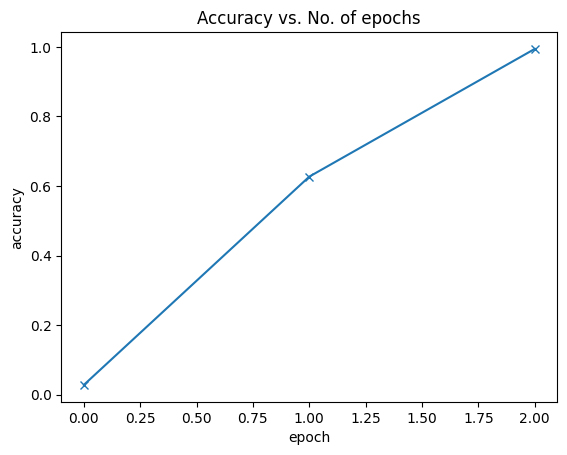

In [ ]:
plot_accuracies(history)

## Validation loss

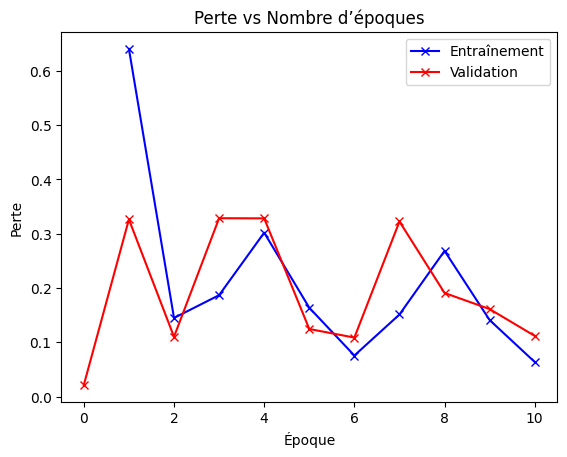

In [ ]:
plot_losses(history)

## Learning Rate overtime

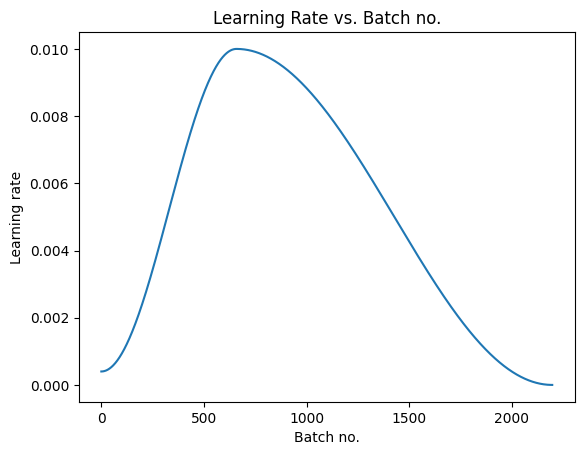

In [ ]:
plot_lrs(history)

**Resnet-18**

In [ ]:
train_tf = transforms.Compose([
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225])

])

test_tf = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
])



In [ ]:
# datasets for validation and training
train = ImageFolder(
    train_dir,
    transform= train_tf
)
valid = ImageFolder(
    valid_dir,
    transform=test_tf
)

In [ ]:
train_dl = DataLoader(
    train, batch_size, shuffle=True, num_workers=2, pin_memory=True)

valid_dl = DataLoader(
    valid, batch_size, num_workers=2, pin_memory=True)

In [ ]:
# Moving data into GPU
train_dl = DeviceDataLoader(
    train_dl,
    device)
valid_dl = DeviceDataLoader(
    valid_dl,
    device)

In [ ]:
from torchvision import models
import torch.nn as nn

class ResNet18TL(ImageClassificationBase):
    def __init__(self, num_classes, freeze_backbone=True):
        super().__init__()
        m = models.resnet18(weights=models.ResNet18_Weights.IMAGENET1K_V1)

        if freeze_backbone:
            for p in m.parameters():
                p.requires_grad = False

        # replace head
        in_feats = m.fc.in_features
        m.fc = nn.Linear(in_feats, num_classes)

        self.model = m

    def forward(self, x):
        return self.model(x)


In [ ]:
num_classes = len(train.classes)
model = to_device(ResNet18TL(num_classes, freeze_backbone=True), device)


In [ ]:
epochs = 2
max_lr = 0.01
grad_clip = 0.1
weight_decay = 1e-4
opt_func = torch.optim.Adam

In [ ]:
%%time
history += fit_OneCycle(epochs, max_lr, model, train_dl, valid_dl,
                             grad_clip=grad_clip,
                             weight_decay=1e-4,
                             opt_func=opt_func)

Epoch [0], last_lr: 0.00812, train_loss: 0.6608, val_loss: 3.2038, val_acc: 0.4554


Epoch [1], last_lr: 0.00000, train_loss: 0.1743, val_loss: 2.8239, val_acc: 0.4994
CPU times: user 38.7 s, sys: 38.3 s, total: 1min 16s
Wall time: 3min 27s


In [ ]:
# getting summary of the model
INPUT_SHAPE = (3, 256, 256)
print(summary(model.cuda(), (INPUT_SHAPE)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           9,408
       BatchNorm2d-2         [-1, 64, 128, 128]             128
              ReLU-3         [-1, 64, 128, 128]               0
         MaxPool2d-4           [-1, 64, 64, 64]               0
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
              ReLU-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
             ReLU-10           [-1, 64, 64, 64]               0
       BasicBlock-11           [-1, 64, 64, 64]               0
           Conv2d-12           [-1, 64, 64, 64]          36,864
      BatchNorm2d-13           [-1, 64, 64, 64]             128
             ReLU-14           [-1, 64,

### We got an accuracy of 49.9 %

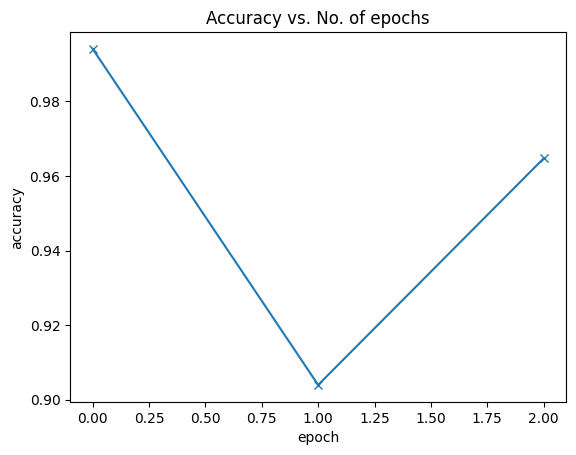

In [ ]:
plot_accuracies(history)

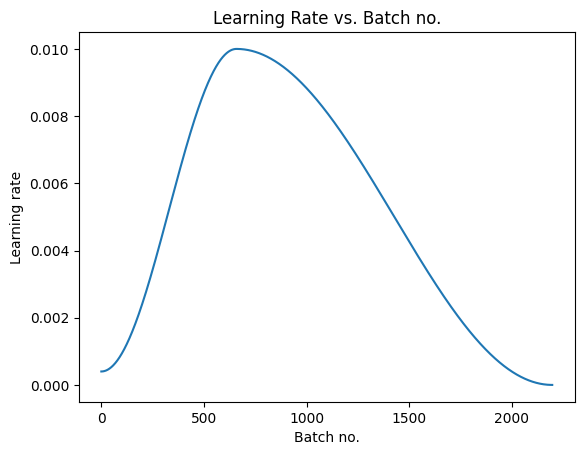

In [ ]:
plot_lrs(history)

In [ ]:
# saving the entire model to working directory
PATH = './plant-disease-model2.pth'
torch.save(model, PATH)

      **Resnet 9**
      
Total params: 6,589,734
Trainable params: 6,589,734
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.75
Forward/backward pass size (MB): 343.95
Params size (MB): 25.14
Estimated Total Size (MB): 369.83
----------------------------------------------------------------
Non


     **Resnet 18**
Total params: 11,196,006
Trainable params: 19,494
Non-trainable params: 11,176,512
----------------------------------------------------------------
Input size (MB): 0.75
Forward/backward pass size (MB): 82.00
Params size (MB): 42.71
Estimated Total Size (MB): 125.46
----------------------------------------------------------------
None

In [ ]:
import random, torch, torch.nn as nn

def random_search(model_class, num_classes, train_loader, val_loader, device, n_trials=6, epochs=2):
    lr_values = [1e-4, 3e-4, 1e-3, 3e-3, 1e-2]
    wd_values = [0.0, 1e-5, 1e-4, 1e-3]
    criterion = nn.CrossEntropyLoss()
    results = []

    for i in range(n_trials):
        lr = random.choice(lr_values)
        wd = random.choice(wd_values)
        model = model_class(num_classes).to(device)
        optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=wd)

        # --- train few epochs ---
        for _ in range(epochs):
            model.train()
            for xb, yb in train_loader:
                xb, yb = xb.to(device), yb.to(device)
                loss = criterion(model(xb), yb)
                optimizer.zero_grad()
                loss.backward()
                optimizer.step()

        # --- validate ---
        model.eval()
        correct, total = 0, 0
        with torch.no_grad():
            for xb, yb in val_loader:
                xb, yb = xb.to(device), yb.to(device)
                preds = model(xb).argmax(dim=1)
                correct += (preds == yb).sum().item()
                total += yb.size(0)
        acc = correct / total
        results.append({"lr": lr, "weight_decay": wd, "val_acc": acc})
        print(f"[{i+1}/{n_trials}] lr={lr:.0e} wd={wd:.0e} → acc={acc:.4f}")

    best = max(results, key=lambda x: x["val_acc"])
    print("\nBest config:", best)
    return best, results


In [ ]:
best, results = random_search(
    lambda n: ResNet18TL(n, freeze_backbone=True),
    len(train.classes),
    train_dl,
    valid_dl,
    device,
    n_trials=6,
    epochs=2
)


[1/6] lr=1e-03 wd=1e-05 → acc=0.9567


[2/6] lr=1e-04 wd=1e-03 → acc=0.9050


[3/6] lr=1e-04 wd=1e-05 → acc=0.9063


KeyboardInterrupt: 

# 🧪 Test du meilleur modèle sur l’ensemble de test


**We only have 33 images in test data, so let's check the model on all images**

In [ ]:
test_dir = "/tmp/extracted/test"
test = ImageFolder(test_dir, transform=transforms.ToTensor())

In [ ]:
test_images = sorted(os.listdir(test_dir + '/test')) # since images in test folder are in alphabetical order
test_images

['AppleCedarRust1.JPG',
 'AppleCedarRust2.JPG',
 'AppleCedarRust3.JPG',
 'AppleCedarRust4.JPG',
 'AppleScab1.JPG',
 'AppleScab2.JPG',
 'AppleScab3.JPG',
 'CornCommonRust1.JPG',
 'CornCommonRust2.JPG',
 'CornCommonRust3.JPG',
 'PotatoEarlyBlight1.JPG',
 'PotatoEarlyBlight2.JPG',
 'PotatoEarlyBlight3.JPG',
 'PotatoEarlyBlight4.JPG',
 'PotatoEarlyBlight5.JPG',
 'PotatoHealthy1.JPG',
 'PotatoHealthy2.JPG',
 'TomatoEarlyBlight1.JPG',
 'TomatoEarlyBlight2.JPG',
 'TomatoEarlyBlight3.JPG',
 'TomatoEarlyBlight4.JPG',
 'TomatoEarlyBlight5.JPG',
 'TomatoEarlyBlight6.JPG',
 'TomatoHealthy1.JPG',
 'TomatoHealthy2.JPG',
 'TomatoHealthy3.JPG',
 'TomatoHealthy4.JPG',
 'TomatoYellowCurlVirus1.JPG',
 'TomatoYellowCurlVirus2.JPG',
 'TomatoYellowCurlVirus3.JPG',
 'TomatoYellowCurlVirus4.JPG',
 'TomatoYellowCurlVirus5.JPG',
 'TomatoYellowCurlVirus6.JPG']

In [ ]:
def predict_image(img, model):
    """Converts image to array and return the predicted class
        with highest probability"""
    # Convert to a batch of 1
    xb = to_device(img.unsqueeze(0), device)
    # Get predictions from model
    yb = model(xb)
    # Pick index with highest probability
    _, preds  = torch.max(yb, dim=1)
    # Retrieve the class label

    return train.classes[preds[0].item()]

Label: AppleCedarRust1.JPG , Predicted: Apple___Cedar_apple_rust


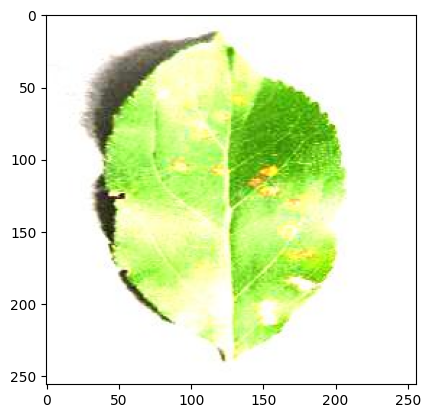

In [ ]:
# predicting first image
img, label = test[0]
plt.imshow(img.permute(1, 2, 0))
print('Label:', test_images[0], ', Predicted:', predict_image(img, model))

In [ ]:
# getting all predictions (actual label vs predicted)
for i, (img, label) in enumerate(test):
    print('Label:', test_images[i], ', Predicted:', predict_image(img, model))

Label: AppleCedarRust1.JPG , Predicted: Apple___Cedar_apple_rust
Label: AppleCedarRust2.JPG , Predicted: Apple___Cedar_apple_rust
Label: AppleCedarRust3.JPG , Predicted: Apple___Cedar_apple_rust
Label: AppleCedarRust4.JPG , Predicted: Apple___Cedar_apple_rust
Label: AppleScab1.JPG , Predicted: Apple___Apple_scab
Label: AppleScab2.JPG , Predicted: Apple___Apple_scab
Label: AppleScab3.JPG , Predicted: Apple___Apple_scab
Label: CornCommonRust1.JPG , Predicted: Corn_(maize)___Common_rust_
Label: CornCommonRust2.JPG , Predicted: Corn_(maize)___Common_rust_
Label: CornCommonRust3.JPG , Predicted: Corn_(maize)___Common_rust_
Label: PotatoEarlyBlight1.JPG , Predicted: Potato___Early_blight
Label: PotatoEarlyBlight2.JPG , Predicted: Potato___Early_blight
Label: PotatoEarlyBlight3.JPG , Predicted: Potato___Early_blight
Label: PotatoEarlyBlight4.JPG , Predicted: Potato___Early_blight
Label: PotatoEarlyBlight5.JPG , Predicted: Potato___Early_blight
Label: PotatoHealthy1.JPG , Predicted: Potato___h

**We can see that the model predicted all the test images perfectly!!!!**

# Sauvegarde

**There are several ways to save the model in Pytorch, following are the two most common ways**

In [ ]:
# saving the entire model to working directory
PATH = './plant-disease-model-complete.pth'
torch.save(model, PATH)

# Conclusion

```markdown
Les modèles ResNet offrent d’excellentes performances pour la classification d’images lorsque certains hyperparamètres sont ajustés et que des techniques comme la programmation du taux d’apprentissage (learning rate scheduling), le *gradient clipping* et le *weight decay* sont appliquées.  
Le modèle parvient à prédire parfaitement chaque image de l’ensemble de test, sans aucune erreur !

 Pourquoi ResNet 9
J’ai choisi l’architecture ResNet car elle permet d’entraîner des réseaux profonds efficacement grâce à l’utilisation de *skip connections*, qui atténuent le problème du gradient qui disparaît. Cela rend l’apprentissage plus stable et améliore la généralisation du modèle, même avec un grand nombre de couches.
```
